In [1]:
%load_ext autoreload
%autoreload 2
import scanpy as sc
import scvi
import numpy as np
import pandas as pd
from scanpy_helpers.annotation import AnnotationHelper
from warnings import filterwarnings

sc.settings.verbosity = 3

filterwarnings("ignore", category=FutureWarning)
sc.set_figure_params(figsize=(5, 5))

In [2]:
cell_type_scores_dir = "../../data/50_myeloid_cells/10_cell_type_scoring/"
output_dir = "../../data/50_myeloid_cells/20_cell_type_annotation/"
deploy_dir = "../../deploy/Ab1MxvlS9c56BaA0Z94J/figures/"

In [3]:
adata = sc.read_h5ad("../../data/50_myeloid_cells/01_myeloid_subset/adata.h5ad")
adata_scvi = sc.read_h5ad(
    "../../data/50_myeloid_cells/01_myeloid_subset/adata_scvi.h5ad"
)

The two adatas are identical, excapt `adata_scvi` contains the counts in `X`, `adata` the log-normalized counts. 

In [4]:
assert adata.shape == adata_scvi.shape

# Cell-type annotation
In this notebook, we perform manual cell-type 
annotation based on unsupervised clustering, marker genes, and cell-type scores
obtained from the deconvolution methods in the previous notebook. 

### Run scVI

We use scVI to generate a batch-corrected, latent representation of the myeloid single-cells. 
Since we also want to use scVI for differential expression testing, I do not subset it to the
most highly variable cells. Since `n_cell` $\approx$ `n_genes`, this is ok according to the authors. 
I also visually compared the result to using the subset only, and it changed only slightly. 

In [5]:
scvi.data.setup_anndata(adata_scvi, batch_key="sample")
scvi.data.view_anndata_setup(adata_scvi)

INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              


/data/scratch/sturm/conda/envs/2021-nsclc_heterogeneity-scanpy/lib/python3.8/site-packages/scvi/data/_anndata.py:709: UserWarning: Category 6 in adata.obs['_scvi_batch'] has fewer than 3 cells. SCVI may not train properly.
  warnings.warn(


INFO     Successfully registered anndata object containing 15817 cells, 17567 vars, 80       
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


This would be the code to re-train the model. Since scVI is not 100% reproducible (and in particular not reproducible 
on another system), I stored and load the pre-computed model instead. 

In [6]:
# model = scvi.model.SCVI(adata_scvi, use_cuda=True)
# model.train()
# model.save(f"{output_dir}/scvi_model_all_genes")

In [7]:
%%capture
# Load the pre-computed model.
model = scvi.model.SCVI.load(f"{output_dir}/scvi_model_all_genes", adata_scvi)

In [8]:
adata.obsm["X_scVI"] = model.get_latent_representation(adata_scvi)

### Compute UMAP based on scVI

In [9]:
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=15)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5, random_state=0)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


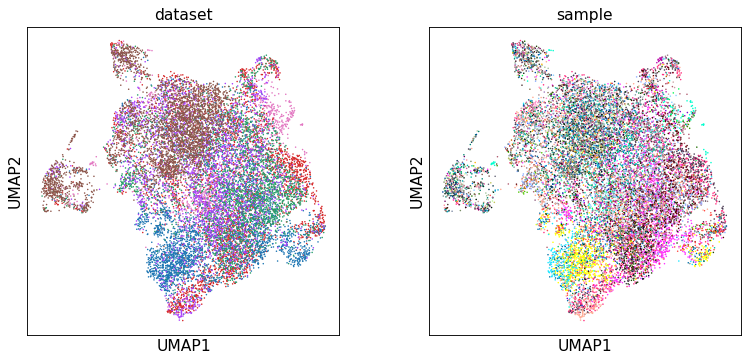

In [10]:
sc.pl.umap(adata, color=["dataset", "sample"], legend_loc="none")

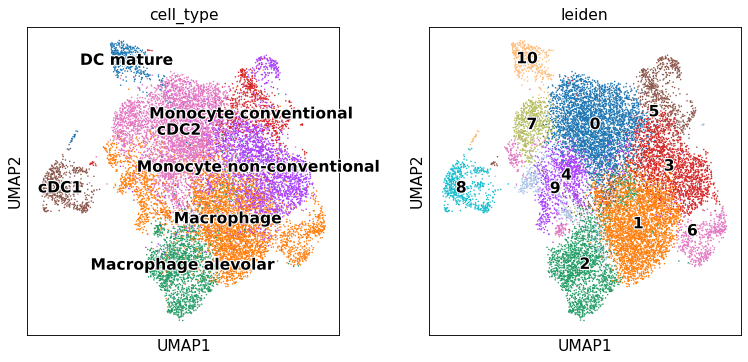

In [11]:
sc.pl.umap(
    adata, color=["cell_type", "leiden"], legend_loc="on data", legend_fontoutline=2
)

In [12]:
adata.obs["n_genes"] = np.sum(adata.X != 0, axis=1)

## Annotate cell types

### plot cell-type markers

Cell-type markers have been curated from
 * [Schupp et al](https://www.biorxiv.org/content/10.1101/2020.10.21.347914v1)
 * [Lambrechts et al.](https://doi.org/10.1038/s41591-018-0096-5)
 * [Madissoon et al. ](https://doi.org/10.1186/s13059-019-1906-x)
 * [Alshetaiwi et al.](https://immunology.sciencemag.org/content/5/44/eaay6017)

and are summarized in [this google sheet](https://docs.google.com/spreadsheets/d/1beW-9oeM31P50NFvNLVvsdXlfh_tOjsmIrnwV2ZlxDU/edit#gid=966184166). 

In [13]:
ah = AnnotationHelper()

DC Lagerhans


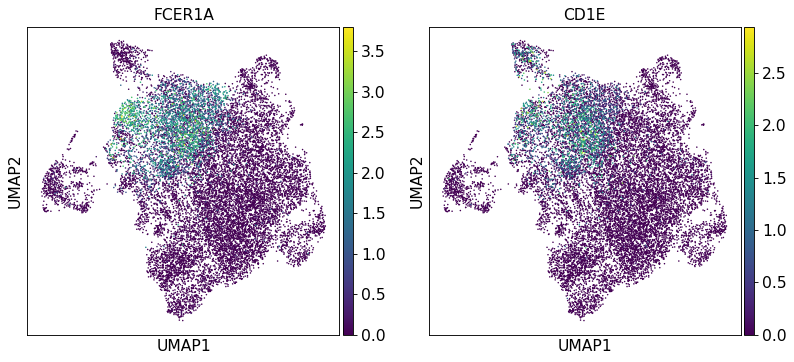

DC mature


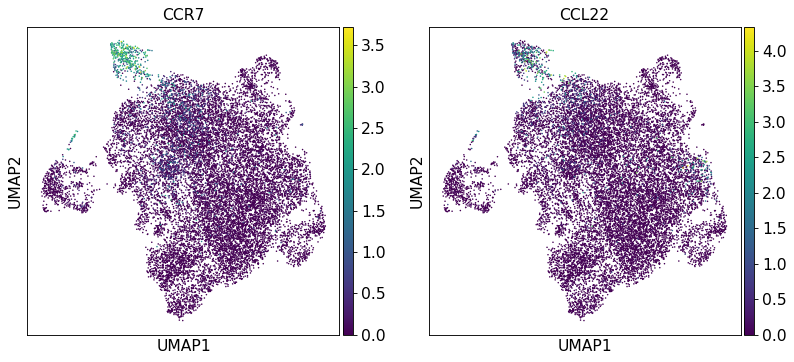

Dividing


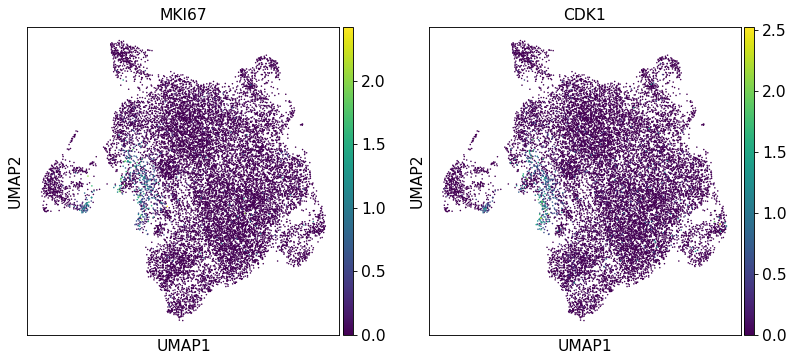

MDSC


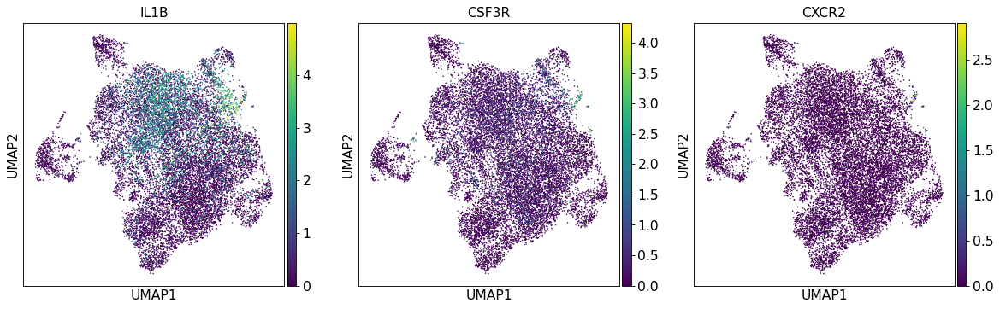

Macrophage


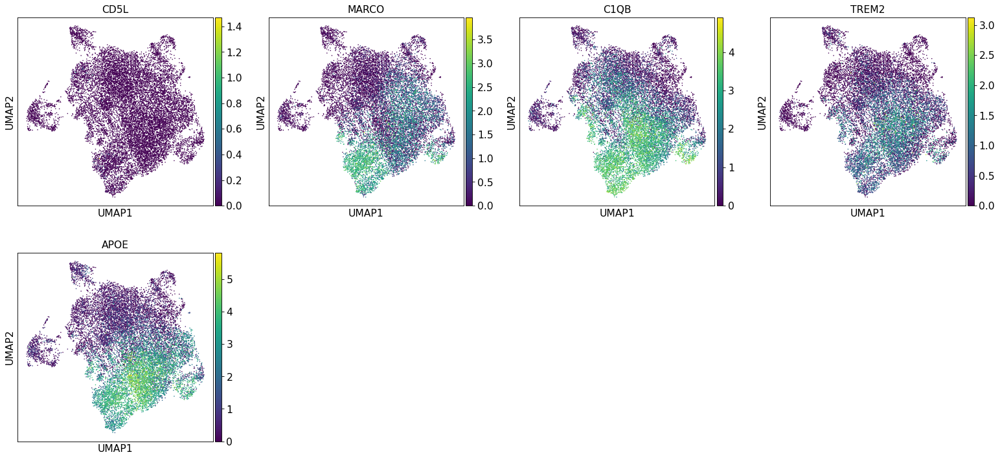

Macrophage alveolar


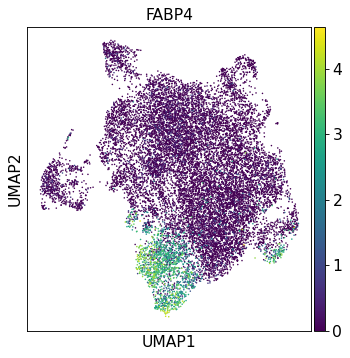

Monocyte


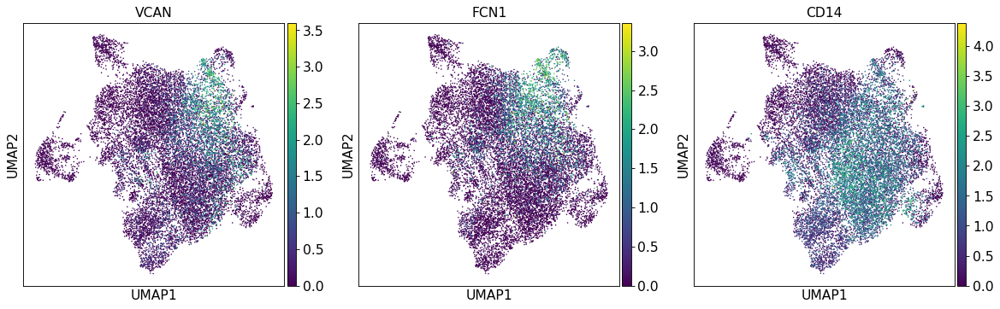

Monocyte conventional


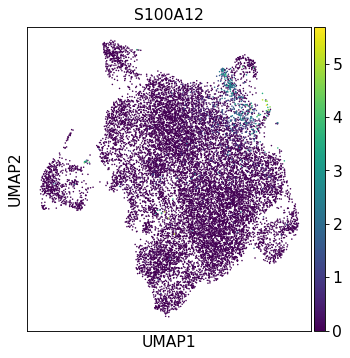

Monocyte non-coventional


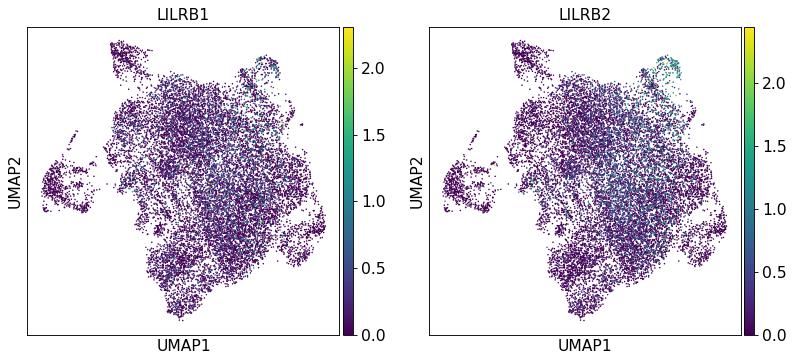

cDC1


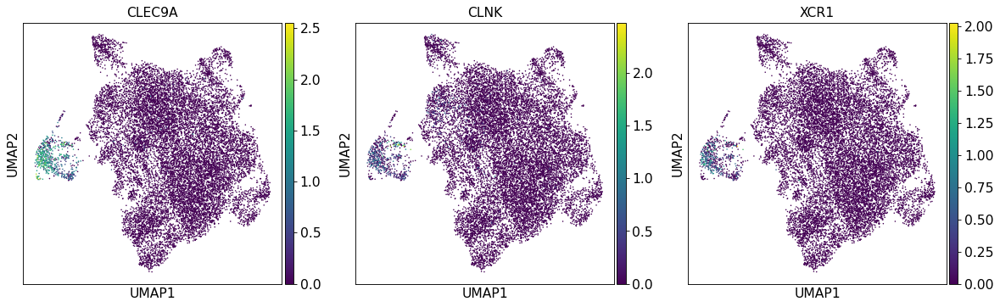

cDC2


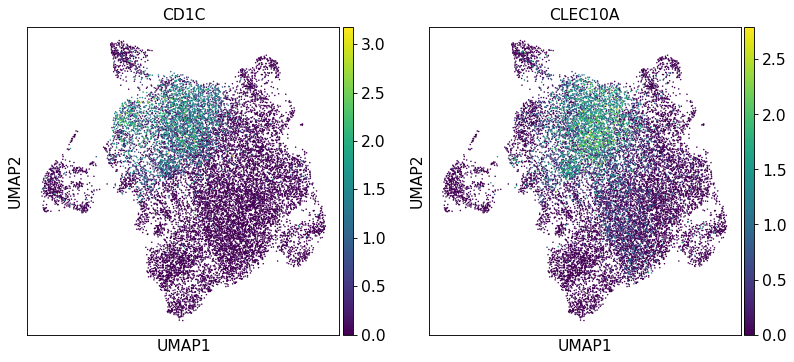

pDC


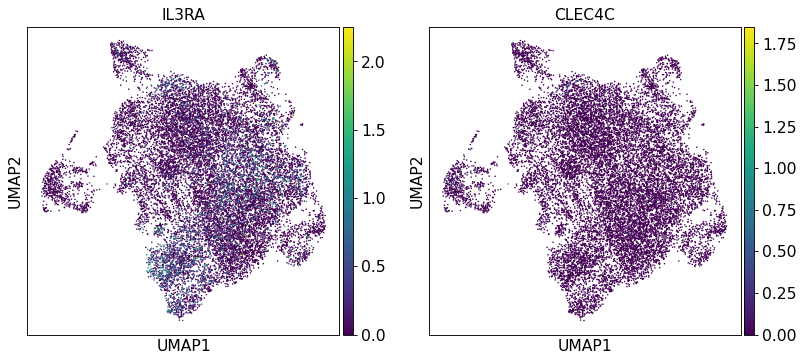

In [14]:
ah.plot_umap(adata, filter_cell_type=["Macro", "Mono", "DC", "MDSC", "Div"])

## Load results form SingleR, xCell and CIBERSORT

Also tested quanTIseq, but does not perform well for this use case. 

### SingleR scores

In [15]:
singler_res = pd.read_csv(f"{cell_type_scores_dir}/singler_res.csv")

In [16]:
adata.obs["singler_macrophages"] = singler_res["Macrophages"].values
adata.obs["singler_mono"] = singler_res["Monocytes"].values
adata.obs["singler_m1"] = singler_res["Macrophages M1"].values
adata.obs["singler_m2"] = singler_res["Macrophages M2"].values
adata.obs["singler_labels"] = singler_res["labels"].values

... storing 'singler_labels' as categorical


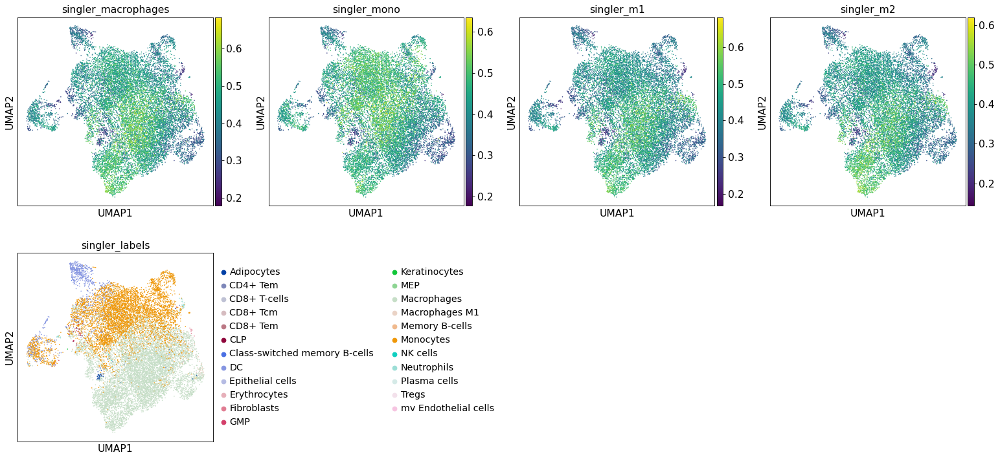

In [17]:
sc.pl.umap(
    adata,
    color=[
        "singler_macrophages",
        "singler_mono",
        "singler_m1",
        "singler_m2",
        "singler_labels",
    ],
)

### xCell

In [18]:
xcell_res = pd.read_csv(f"{cell_type_scores_dir}/xcell_res.csv").set_index("cell_type")

In [19]:
for cell_type in xcell_res.index.values:
    adata.obs[f"xcell {cell_type}"] = xcell_res.loc[cell_type, :].values

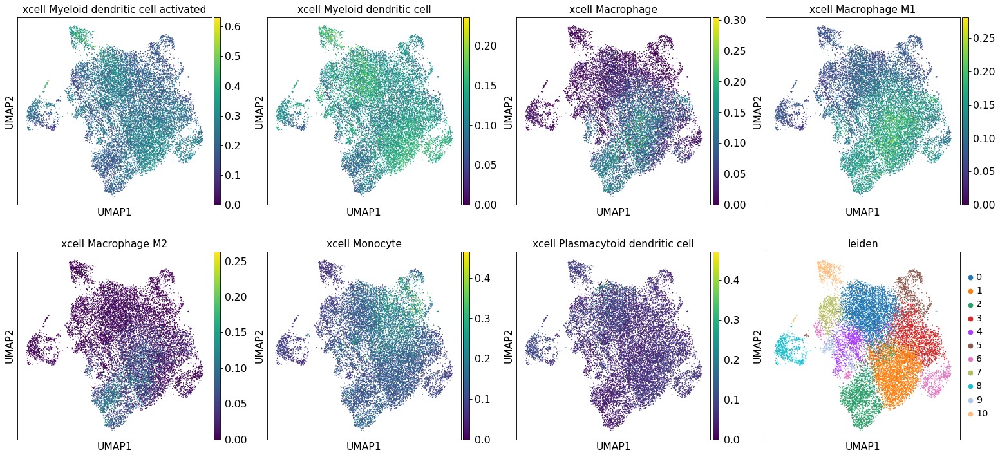

In [20]:
sc.pl.umap(
    adata,
    color=[f"xcell {cell_type}" for cell_type in xcell_res.index.values] + ["leiden"],
)

### CIBERSORT

CIBERSORT failed for a few (~150) cells, but this appears random (possibly all signature genes = 0) 
and not systematic for a certain subcluster. 

In [21]:
cibersort_res = pd.read_csv(f"{cell_type_scores_dir}/cibersort_res.csv").set_index(
    "cell_type"
)

In [22]:
cibersort_cell_types = [
    "Monocyte",
    "Macrophage M0",
    "Macrophage M1",
    "Macrophage M2",
    "Myeloid dendritic cell resting",
    "Myeloid dendritic cell activated",
]
for cell_type in cibersort_cell_types:
    adata.obs[f"cibersort {cell_type}"] = cibersort_res.loc[cell_type, :]

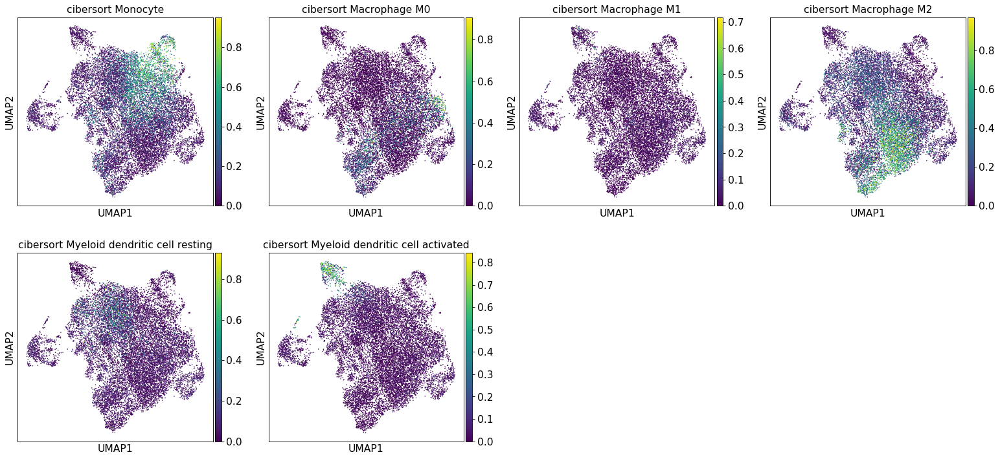

In [23]:
sc.pl.umap(
    adata, color=[f"cibersort {cell_type}" for cell_type in cibersort_cell_types]
)

### Plot Transcription factors

In [24]:
# pathways_of_interest = [
#     f"PW:{x}" for x in ["JAK-STAT", "VEGF", "PI3K", "NFkB", "Trail", "TNFa"]
# ]

In [25]:
# tfs_of_interest = [
#     f"TF:{tf}" for tf in ["SPI1", "NFKB1", "STAT1", "MYC", "E2F4", "E2F2", "ZNF263"]
# ]

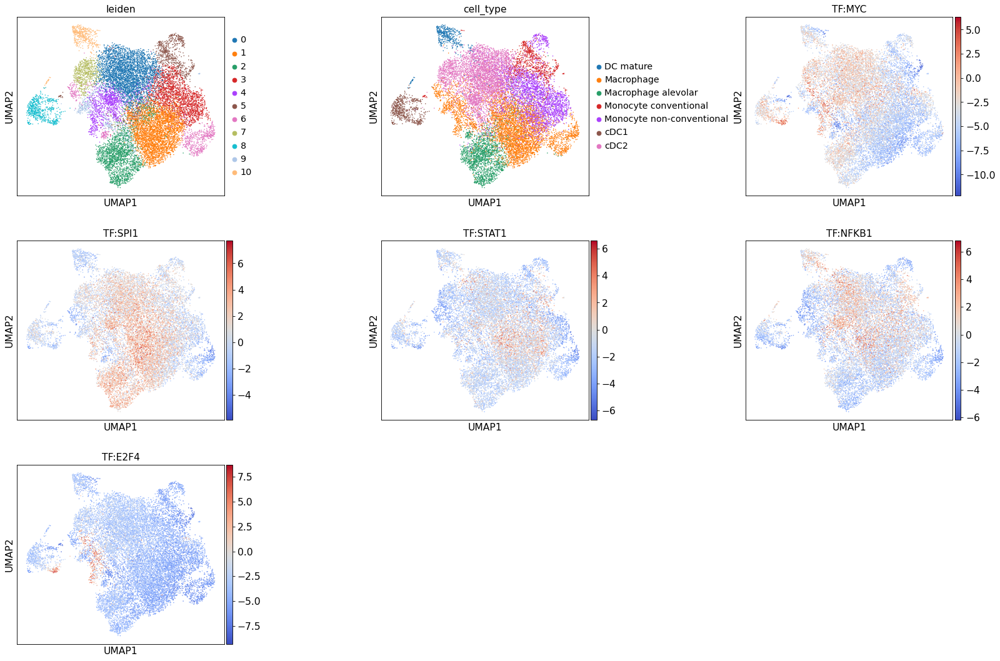

In [26]:
sc.pl.umap(
    adata,
    color=[
        "leiden",
        "cell_type",
        "TF:MYC",
        "TF:SPI1",
        "TF:STAT1",
        "TF:NFKB1",
        "TF:E2F4",
    ],
    ncols=3,
    wspace=0.6,
    legend_fontoutline=1,
    cmap="coolwarm",
)

### Annotate cell types

I annotate cell-types by manually assigning each leiden cluster a cell-type labels
based on the plots of marker genes and deconvolution scores above. 
Sometimes the border is ambiguous which warrants subclustering to refine it. 

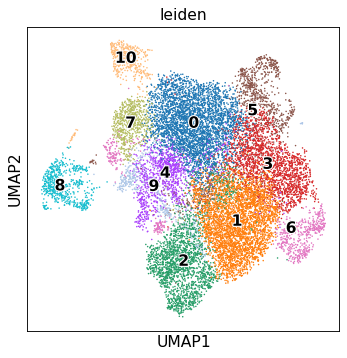

In [27]:
sc.pl.umap(adata, color="leiden", legend_loc="on data", legend_fontoutline=2)

In [28]:
ct_map = {
    "mDC mature": [10],
    "cDC1": [8],
    "C9": [9],
    "C4": [4],
    "DC Lagerhans": [7],
    "ambiguous1": [0, 5, 3],
    "Macro M1-like": [1],
    "Macro M2-like/alevolar": [2],
    "myeloid TF-low": [6, 9],
}

... storing 'cell_type' as categorical


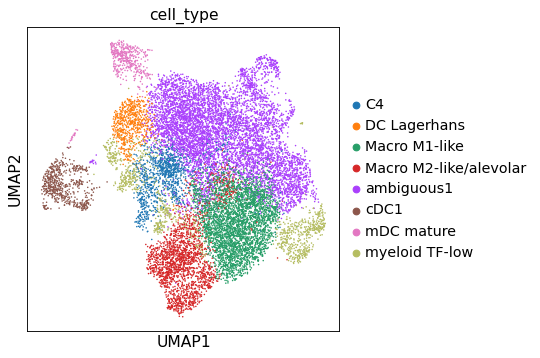

In [29]:
ah.annotate_cell_types(adata, ct_map)

### Subclustering of C4

In [30]:
adata_4 = adata[adata.obs["cell_type"] == "C4", :]

In [31]:
ah.reprocess_adata_subset_scvi(adata_4, leiden_res=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


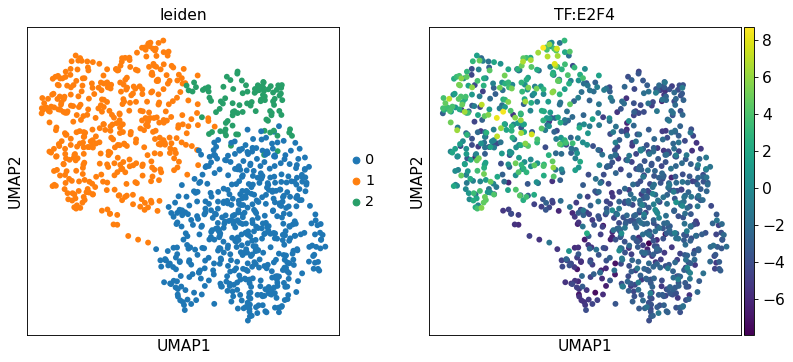

In [32]:
sc.pl.umap(adata_4, color=["leiden", "TF:E2F4"])

Dividing


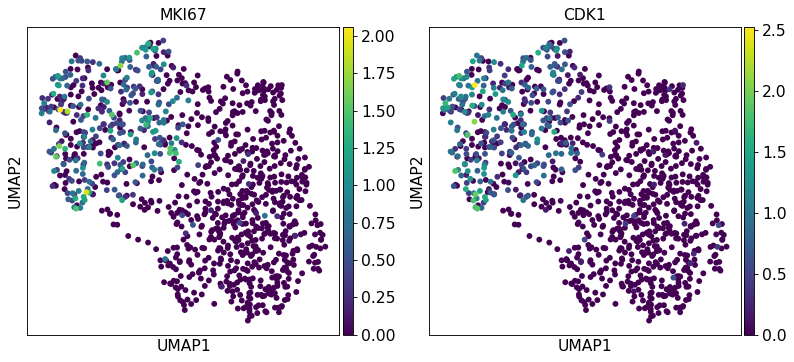

cDC1


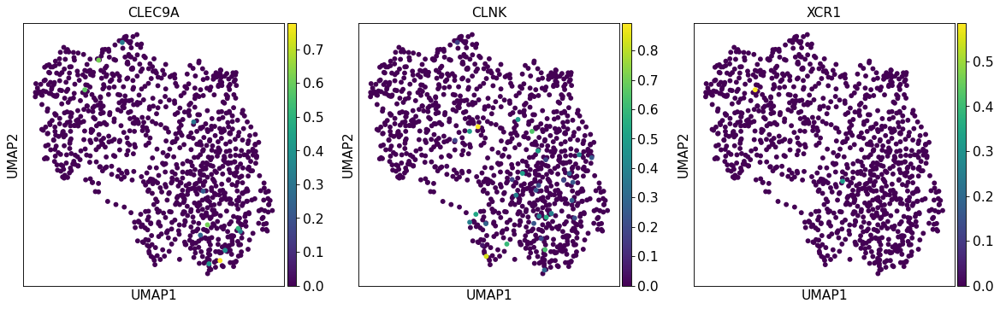

cDC2


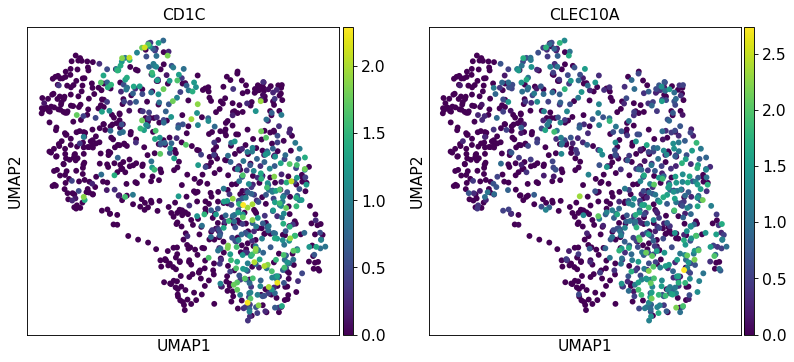

In [33]:
ah.plot_umap(adata_4, filter_cell_type=["Dividing", "cDC"])

... storing 'cell_type' as categorical


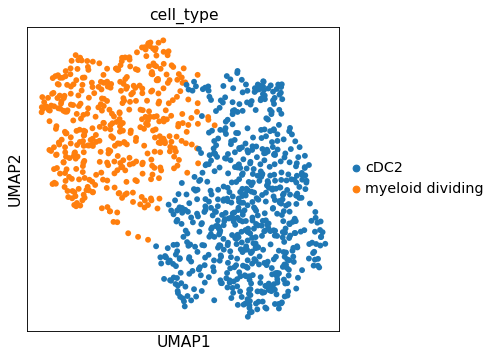

In [34]:
ah.annotate_cell_types(
    adata_4,
    {
        "myeloid dividing": [1],
        "cDC2": [0, 2],
    },
)

... storing 'cell_type' as categorical


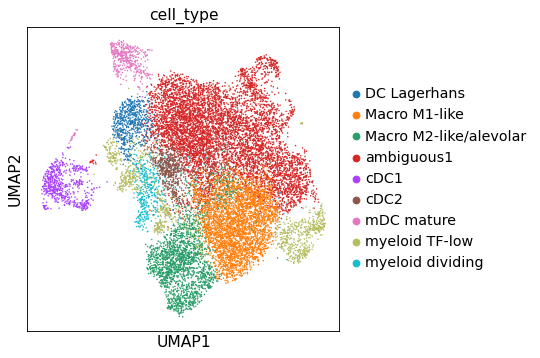

In [35]:
ah.integrate_back(adata, adata_4)

### Subclustering of 'ambigous1'

In [36]:
adata_3 = adata[adata.obs["cell_type"] == "ambiguous1", :]

In [37]:
ah.reprocess_adata_subset_scvi(adata_3, leiden_res=0.5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


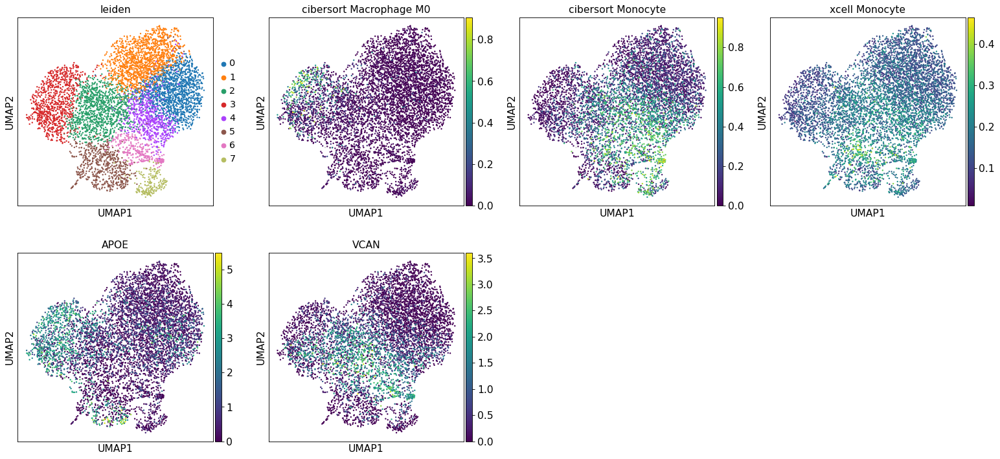

In [38]:
sc.pl.umap(
    adata_3,
    color=[
        "leiden",
        "cibersort Macrophage M0",
        "cibersort Monocyte",
        "xcell Monocyte",
        "APOE",
        "VCAN",
    ],
)

MDSC


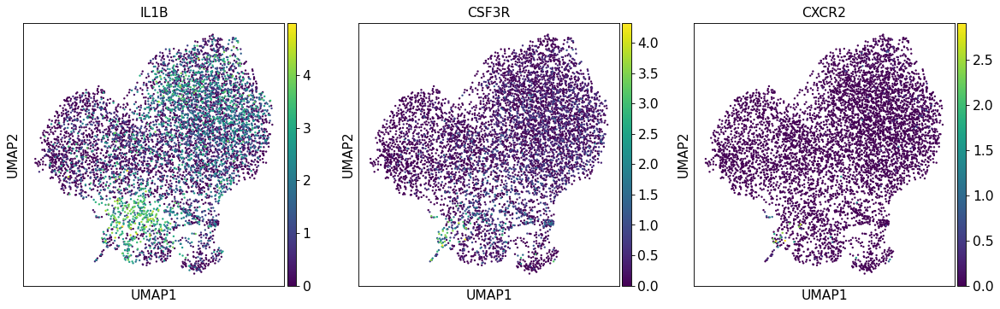

Macrophage


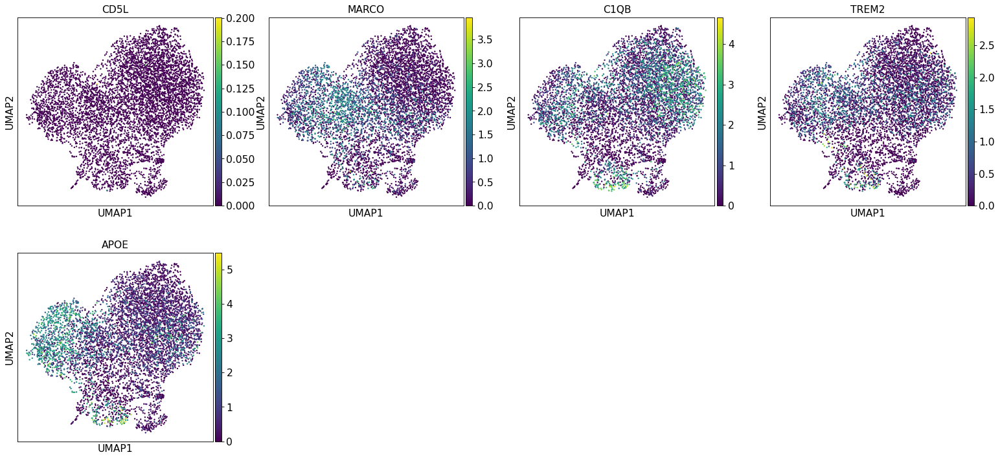

Macrophage alveolar


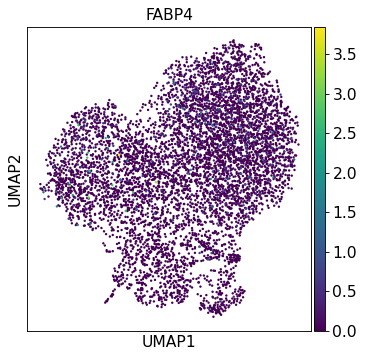

Monocyte


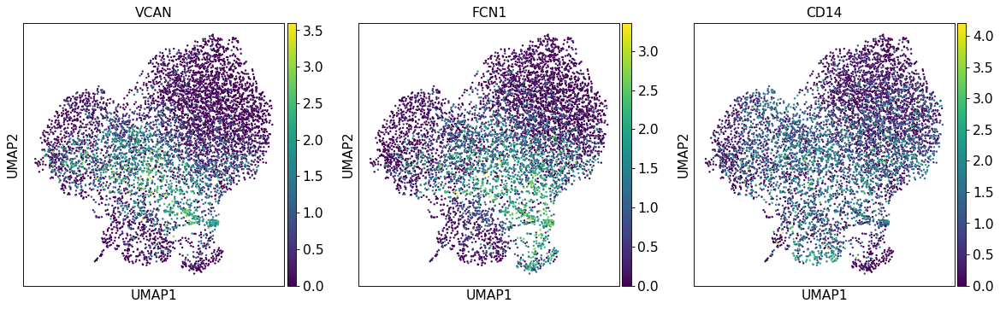

Monocyte conventional


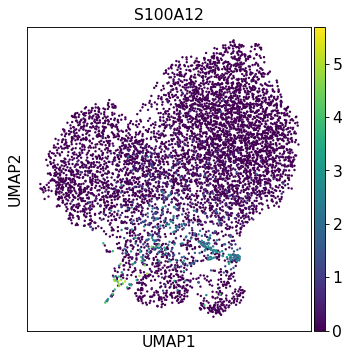

Monocyte non-coventional


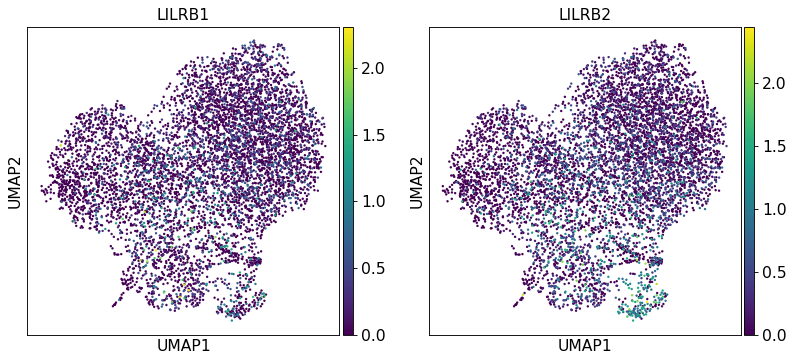

cDC2


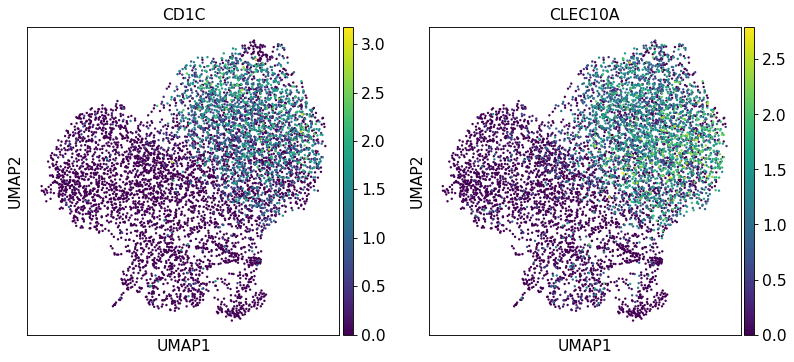

In [39]:
ah.plot_umap(adata_3, filter_cell_type=["MDSC", "Mono", "cDC2", "Macro"])

In [40]:
ct_map = {
    "cDC2": [0, 1],
    "MDSC": [5],
    "Mono": [2, 4, 7, 6],
    "Macro M0": [3],
}

... storing 'cell_type' as categorical


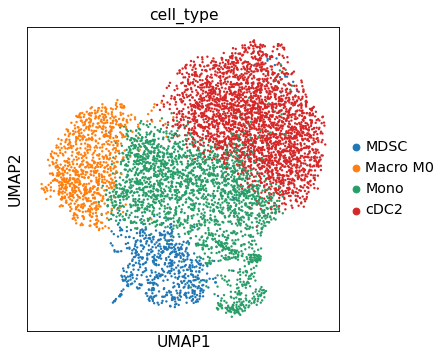

In [41]:
ah.annotate_cell_types(adata_3, ct_map)

### Final cell-type annotation

... storing 'cell_type' as categorical


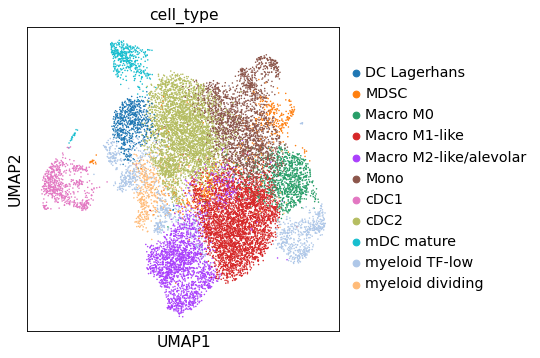

In [42]:
ah.integrate_back(adata, adata_3)

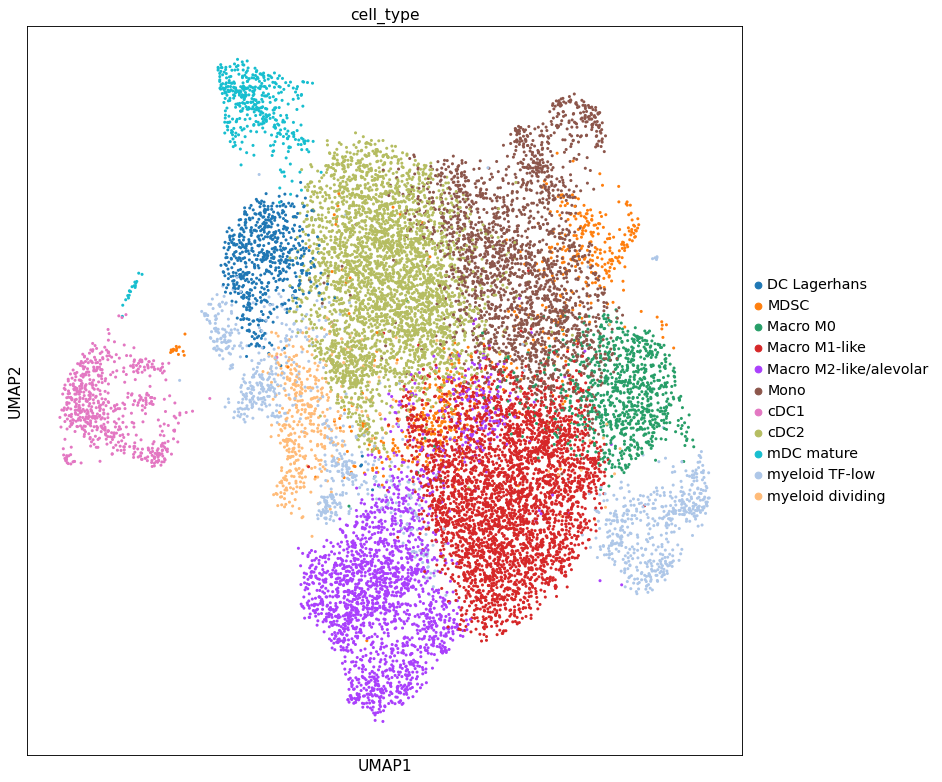

In [43]:
sc.set_figure_params(figsize=(12, 10))
ax =sc.pl.umap(adata, color="cell_type", size=30, show=False)
fig = ax.get_figure()
fig.tight_layout()
fig.savefig(f"{deploy_dir}/umap_cell_type_myeloid.pdf")

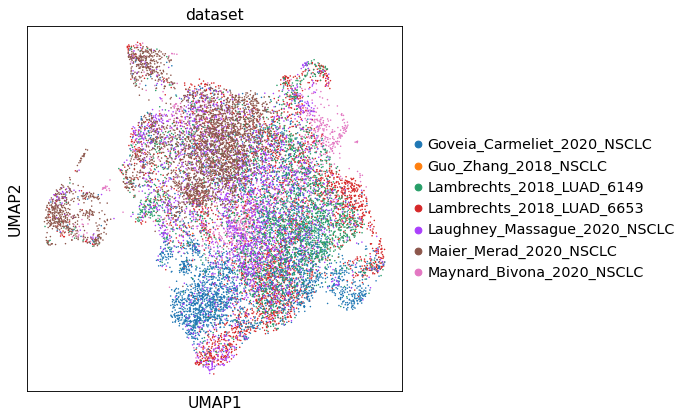

In [44]:
sc.set_figure_params(figsize=(6,6))
sc.pl.umap(adata, color="dataset")

## Export annotated anndata object

In [45]:
adata.write_h5ad("../../data/50_myeloid_cells/20_cell_type_annotation/adata_annotated.h5ad")